<a href="https://colab.research.google.com/github/greasyfinger/Delay_Discounting/blob/main/EEG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%matplotlib inline
import os
import os.path as op
!pip install mne
import mne
import numpy as np
import pandas as pd

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 47.8 MB/s eta 0:00:00


In [ ]:
import os
from pathlib import Path
# !pip install ipyfilechooser
from ipyfilechooser import FileChooser

import pandas as pd
!pip install meeg_tools
from meeg_tools.preprocessing import *
from meeg_tools.utils.epochs import create_epochs
from meeg_tools.utils.raw import read_raw_measurement, filter_raw
from meeg_tools.utils.log import update_log


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 25.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.9/121.9 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 337.9/337.9 kB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 MB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.9/84.9 kB 4.7 MB/s eta 0:00:00
  Created wheel for sklearn: filename=sklearn-0.0.post7-py3-none-any.whl size=2950 sha256=03a2292a3b1f825a3ba1f1cdfd819e792d21112111f79cf3661a3abeea812682
  Stored in directory: /root/.cache/pip/wheels/c8/9c/85/72901eb50bc4bc6e3b2629378d172384ea3dfd19759c77fd2c
Successfully built sklearn


ImportError: ignored

In [ ]:

%matplotlib inline

In [ ]:
# Enter a file in edf format as input
raw = mne.io.read_raw_edf("shivoy_EPOCFLEX_90205_2023.02.03T10.13.51+05.30.edf", preload=True)        # Returns a Raw object containing BrainVision data
raw.load_data()                                                  # Loading continuous data

Extracting EDF parameters from /content/shivoy_EPOCFLEX_90205_2023.02.03T10.13.51+05.30.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 99583  =      0.000 ...   777.992 secs...


<RawEDF | shivoy_EPOCFLEX_90205_2023.02.03T10.13.51+05.30.edf, 114 x 99584 (778.0 s), ~86.7 MB, data loaded>

In [ ]:
raw.info

<Info | 7 non-empty values
 bads: []
 ch_names: TIME_STAMP_s, TIME_STAMP_ms, COUNTER, INTERPOLATED, Cz, Fz, Fp1, ...
 chs: 114 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: 2023-02-03 10:13:51 UTC
 nchan: 114
 projs: []
 sfreq: 128.0 Hz
>

In [ ]:
settings['bandpass_filter']['low_freq'] = 1
settings['bandpass_filter']['high_freq'] = 30

In [ ]:
raw_bandpass = filter_raw(raw)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 423 samples (3.305 s)



[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  10 tasks      | elapsed:    5.0s
[Parallel(n_jobs=8)]: Done 107 out of 114 | elapsed:    6.4s remaining:    0.4s
[Parallel(n_jobs=8)]: Done 114 out of 114 | elapsed:    8.9s finished


Using matplotlib as 2D backend.


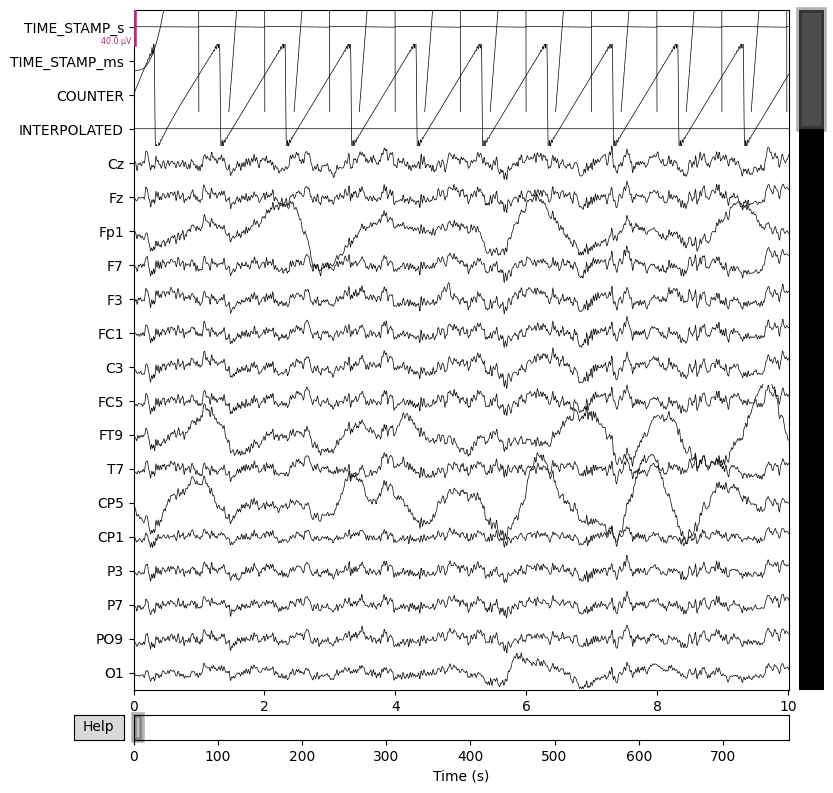

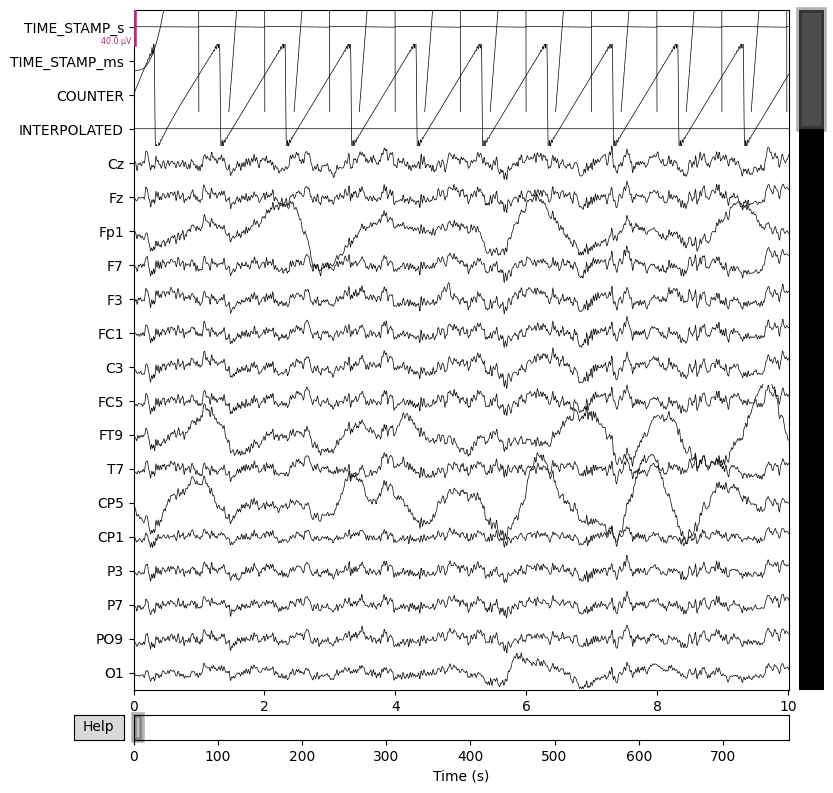

In [ ]:
# print filtered data
raw_bandpass.plot(scalings={'eeg': 20e-6})

In [ ]:
settings['epochs']
epochs = create_epochs(raw=raw_bandpass)

Creating epochs from continuous data ...
Not setting metadata
778 matching events found
No baseline correction applied
0 projection items activated


In [ ]:
# removing bad epochs
epochs_faster = prepare_epochs_for_ica(epochs=epochs)

Preliminary epoch rejection: 
Using data from preloaded Raw for 778 events and 129 original time points ...
1 bad epochs dropped
Bad epochs by amplitude
	[ 86 427 715 719 720 722 723 727 729 730 731 735 736 737 738 739 740 741
 742 743 744 745 746 747 748 749 750 751 752 753 754 755 756 757 758 759
 760 761 762 763 764 765 766 767 768 769 770 771 772 773 774 775 776]
Bad epochs by deviation
	[  0 734 735 737 738 739 740 741 742 745 746 747 748 749 750 751 752 753
 754 756 757 758 759 760 761 762 763 764 765 767 768 770 771 773 774 775]
Bad epochs by variance
	[736 737 738 739 740 743 744 745 746 747 748 749 750 751 752 753 754 756
 757 758 759 760 762 763 764 765 766 767 768 770 771 772 773 774 775 776]
Dropped 55 epochs: 0, 86, 427, 715, 719, 720, 722, 723, 727, 729, 730, 731, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 7

In [ ]:
settings['ica']['n_components'] = 20
settings['ica']['method'] = 'picard'
# ica = run_ica(epochs=epochs_faster)

ica = mne.preprocessing.ICA(n_components=32, random_state=97)
ica.fit(epochs_faster)

Fitting ICA to data using 114 channels (please be patient, this may take a while)
Using data from preloaded Raw for 722 events and 129 original time points ...
Selecting by number: 32 components
Using data from preloaded Raw for 722 events and 129 original time points ...
Fitting ICA took 9.4s.


Method,fastica
Fit,31 iterations on epochs (93138 samples)
ICA components,32
Available PCA components,114
Channel types,eeg
ICA components marked for exclusion,—


Using data from preloaded Raw for 722 events and 129 original time points ...
Not setting metadata
722 matching events found
No baseline correction applied
0 projection items activated


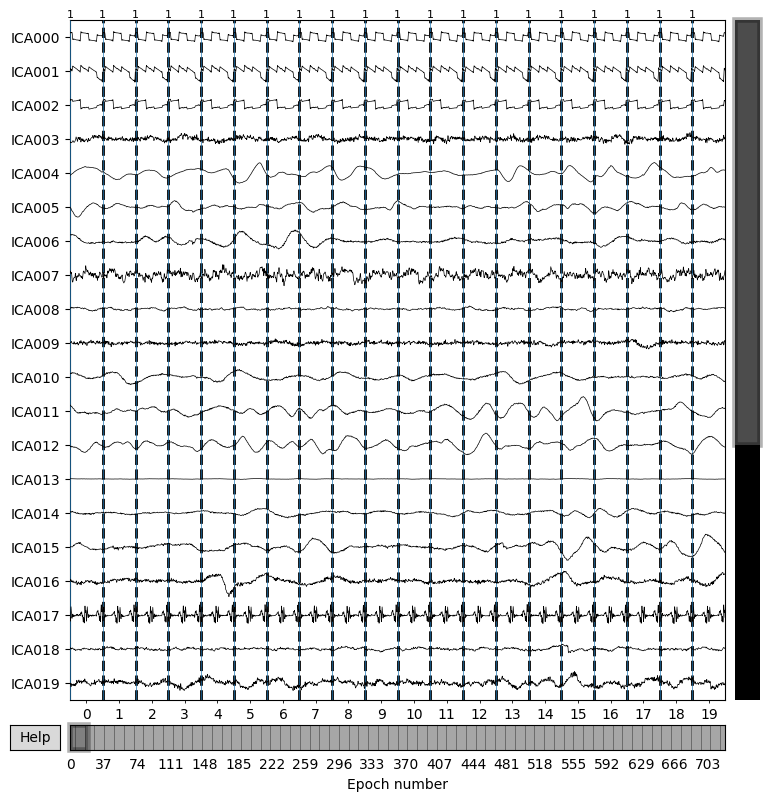

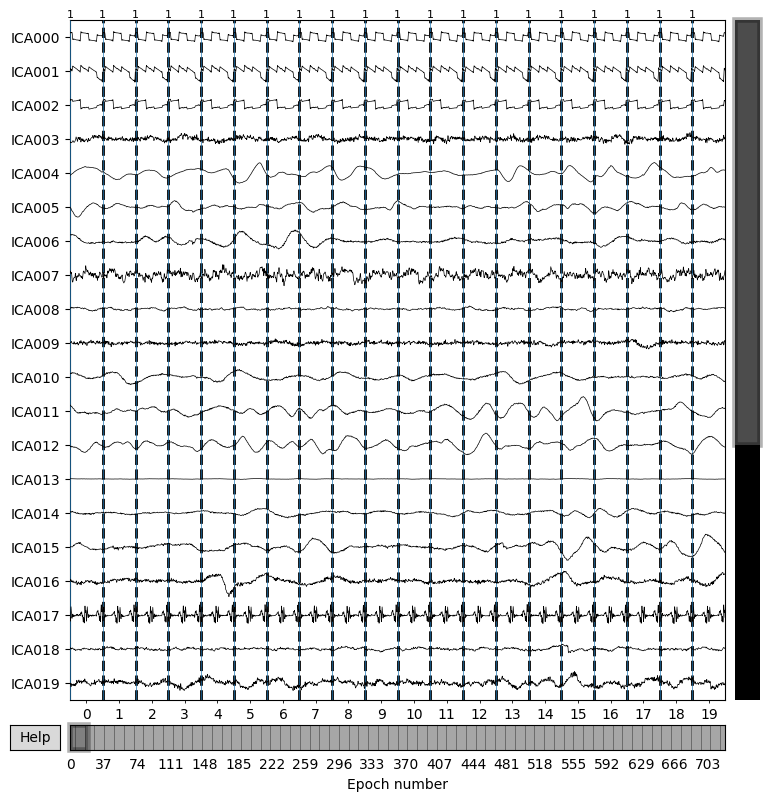

In [ ]:
ica.plot_sources(epochs_faster)

Using data from preloaded Raw for 20 events and 129 original time points ...


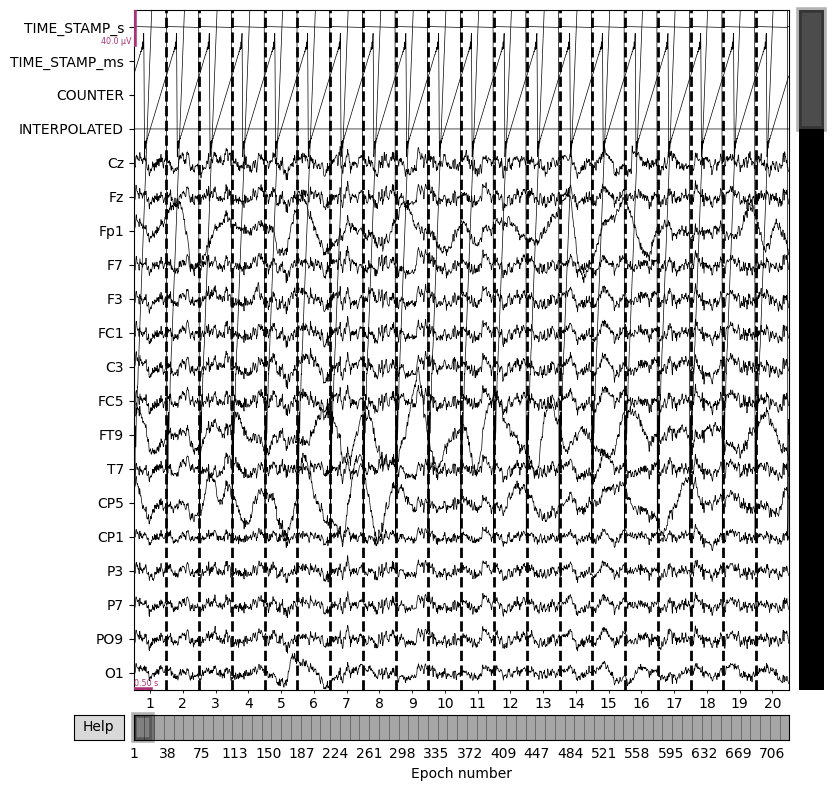

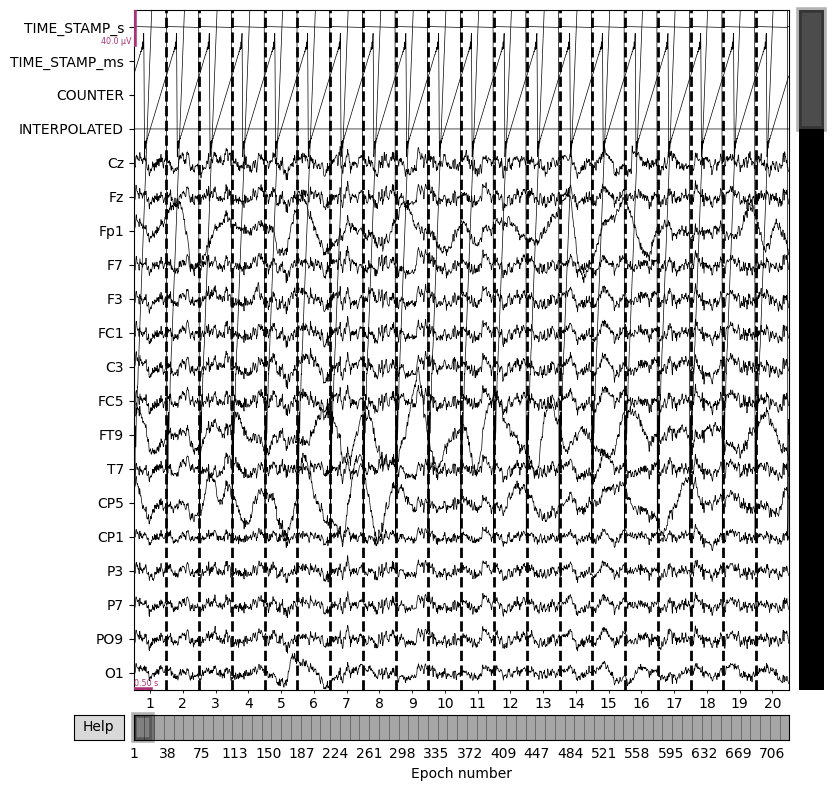

In [ ]:
epochs_ica=epochs_faster
epochs_ica.plot(scalings={'eeg': 20e-6})



In [ ]:
montage = mne.channels.make_standard_montage('standard_1005')

# Get the channel names from the montage
montage_channel_names = montage.ch_names

# Get the channel names from the info attribute
info_channel_names = epochs_ica.info['ch_names']

# Create a mapping of old channel names to new channel names
mapping = {info_channel_names[i]: montage_channel_names[i] for i in range(len(info_channel_names))}

# Rename the channels in the info attribute
epochs_ica.rename_channels(mapping)

# Set the montage to the updated info attribute of your epochs_ica object
epochs_ica.set_montage(montage)

# # Now, you can run Autoreject with the epochs_ica object
reject_log = run_autoreject(epochs_ica, n_jobs=11, subset=True)

Using data from preloaded Raw for 722 events and 129 original time points ...
Fitting autoreject on random (n=180) subset of epochs: 
Running autoreject on ch_type=eeg


  0%|          | Creating augmented epochs : 0/114 [00:00<?,       ?it/s]

  0%|          | Computing thresholds ... : 0/114 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/180 [00:00<?,       ?it/s]

  0%|          | n_interp : 0/3 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/180 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/180 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]

  0%|          | Repairing epochs : 0/180 [00:00<?,       ?it/s]

  0%|          | Fold : 0/10 [00:00<?,       ?it/s]





Estimated consensus=0.30 and n_interpolate=1

AUTOREJECT report
There are 0 bad epochs found with Autoreject. You can assess these epochs with reject_log.bad_epochs

There are 122 bad epochs where more than 15% of the channels were noisy. You can assess these epochs with reject_log.report


In [ ]:
epochs_autoreject = epochs_ica.copy().drop(reject_log.report, reason='AUTOREJECT')

Dropped 122 epochs: 8, 14, 25, 26, 35, 36, 37, 57, 60, 61, 69, 71, 83, 84, 101, 105, 112, 195, 207, 208, 210, 212, 224, 251, 254, 281, 282, 283, 288, 289, 290, 291, 293, 294, 296, 298, 299, 300, 302, 305, 306, 309, 310, 311, 312, 324, 328, 330, 339, 340, 346, 347, 351, 352, 357, 359, 360, 366, 367, 368, 369, 381, 387, 389, 391, 392, 396, 397, 414, 416, 438, 465, 468, 473, 481, 488, 496, 498, 499, 500, 501, 533, 535, 553, 559, 562, 563, 579, 581, 598, 599, 619, 621, 627, 632, 634, 636, 637, 639, 643, 645, 648, 653, 655, 675, 678, 684, 696, 701, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721


Using data from preloaded Raw for 10 events and 129 original time points ...


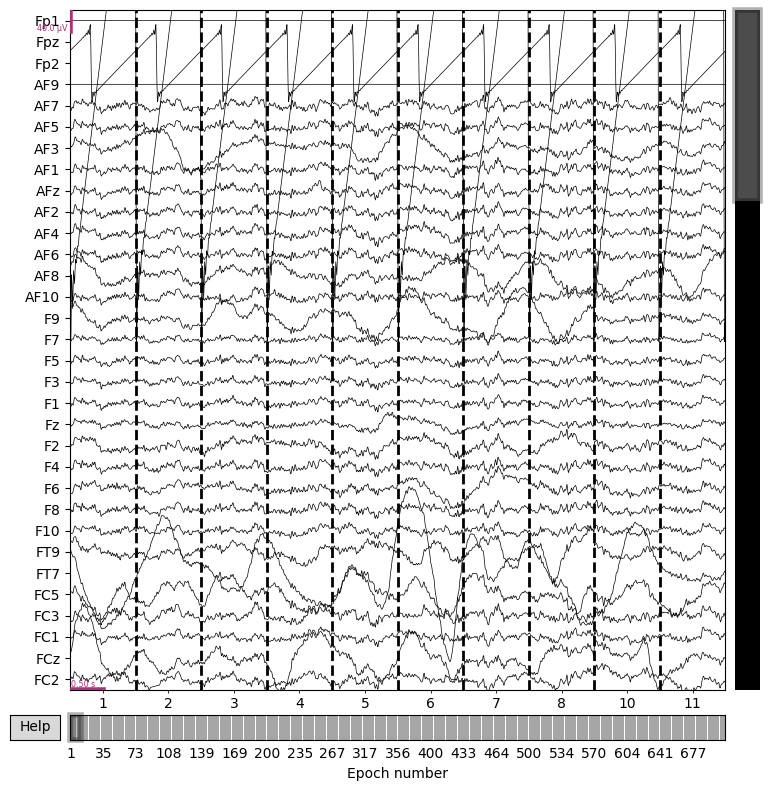

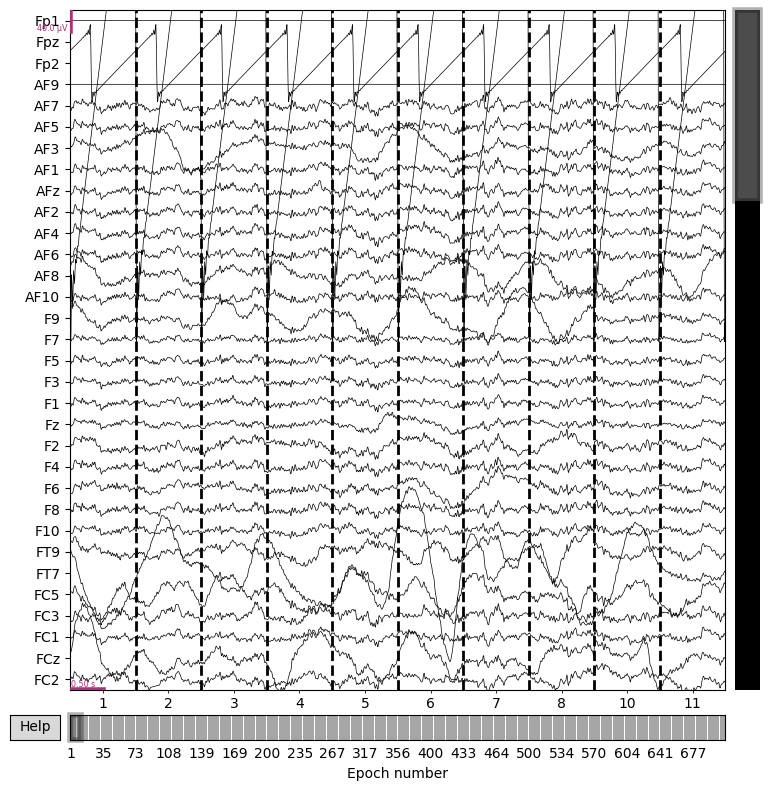

In [ ]:
epochs_autoreject.plot(n_epochs=10, n_channels=32, scalings={'eeg': 20e-6},)

In [ ]:
# findining bad channel
bads = get_noisy_channels(epochs=epochs_autoreject, with_ransac=True)

Creating RawArray with float64 data, n_channels=114, n_times=77400
    Range : 0 ... 77399 =      0.000 ...   604.680 secs
Ready.
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Executing RANSAC
This may take a while, so be patient...
Progress: 10%... 20%... 30%... 40%... 50%... 60%... 70%... 80%... 90%... 100%

RANSAC done!

NoisyChannels REPORT
------------------------
81.0% of the channels were detected as noisy.
(92) channels: Fpz, PO8, CP2, AF9, T9, AFF2h, I1, AFF10h, AFp1h, AFp3h, FFC2h, AFp10h, FC3, PO5, Cz, FFC4h, FFC3h, PO10, FT7, P1, P5, P9, CP3, CPz, AFF5h, FFC5h, FC5, Pz, C1, P8, F2, PO7, TP10, FC1, AF3, PO6, CP1, Fp2, Iz, AFF1h, C5, PO1, AFp2h, Fz, AFp5h, P3, T10, CP6, PO3, AFF8h, FFT7h, AFp9h, AFF4h, O1, PO4, P10, AFF3h, AF8, F7, Oz, T7, PO9, TP7, PO2, FFC6h, FFC1h, P6, AFp7h, C3, AFF6h, FFT9h, AFp8h, AFF9h, AFp4h, AFF7h, Fp1, O2, T8, I2, CP5, P4, AFp6h, TP8, P2, C4, FCz, C6, CP4, TP9, P7, POz, C2


In [ ]:
from mne.epochs import Epochs

def interpolate_bad_channels(epochs, bads):

    epochs.load_data()

    epochs_interpolated = epochs.copy()

    epochs_interpolated.interpolate_bads(reset_bads=True)

    bads_str = ', interpolated: ' + ', '.join(bads)
    if epochs_interpolated.info['description'] is None:
        epochs_interpolated.info['description'] = bads_str
    else:
        epochs_interpolated.info['description'] += bads_str

    return epochs_interpolated


epochs_ransac = interpolate_bad_channels(epochs=epochs_autoreject, bads=bads)
#  confusion(ask sir): the above get noisy channel function detects that 81 percent of the channels were noisy but when I passed those bad channels to the interpolate bad channel function, it says no channels are noisy

<ipython-input-208-0e951d666419>:9: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  epochs_interpolated.interpolate_bads(reset_bads=True)


In [ ]:
epochs_ransac.info

<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, Fpz, Fp2, AF9, AF7, AF5, AF3, AF1, AFz, AF2, AF4, AF6, AF8, ...
 chs: 114 EEG
 custom_ref_applied: False
 description: , interpolated: Fpz, PO8, CP2, AF9, T9, AFF2h, I1, AFF10h, ...
 dig: 117 items (3 Cardinal, 114 EEG)
 highpass: 1.0 Hz
 lowpass: 30.0 Hz
 meas_date: 2023-02-03 10:13:51 UTC
 nchan: 114
 projs: []
 sfreq: 128.0 Hz
>

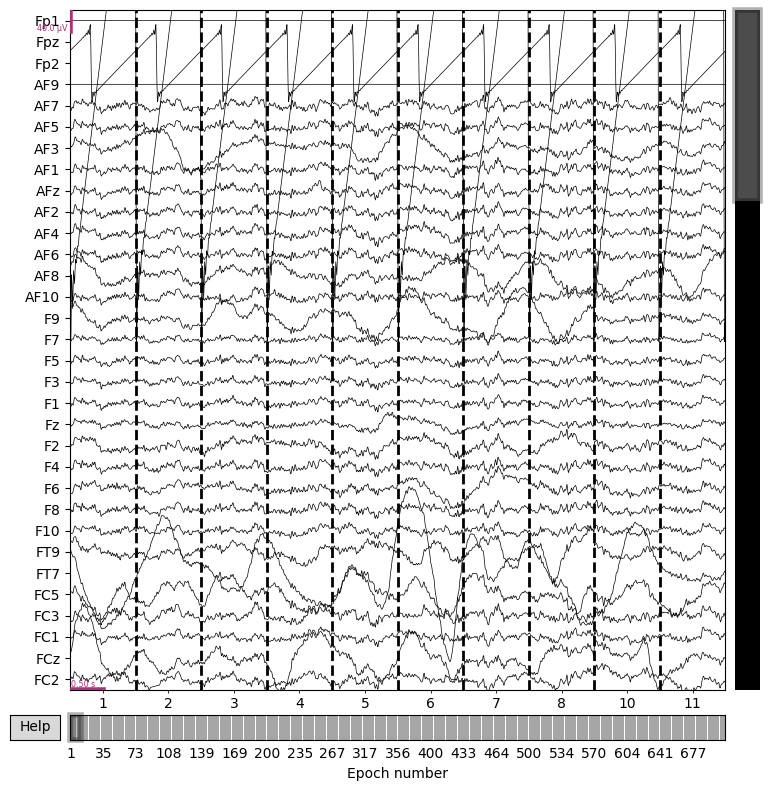

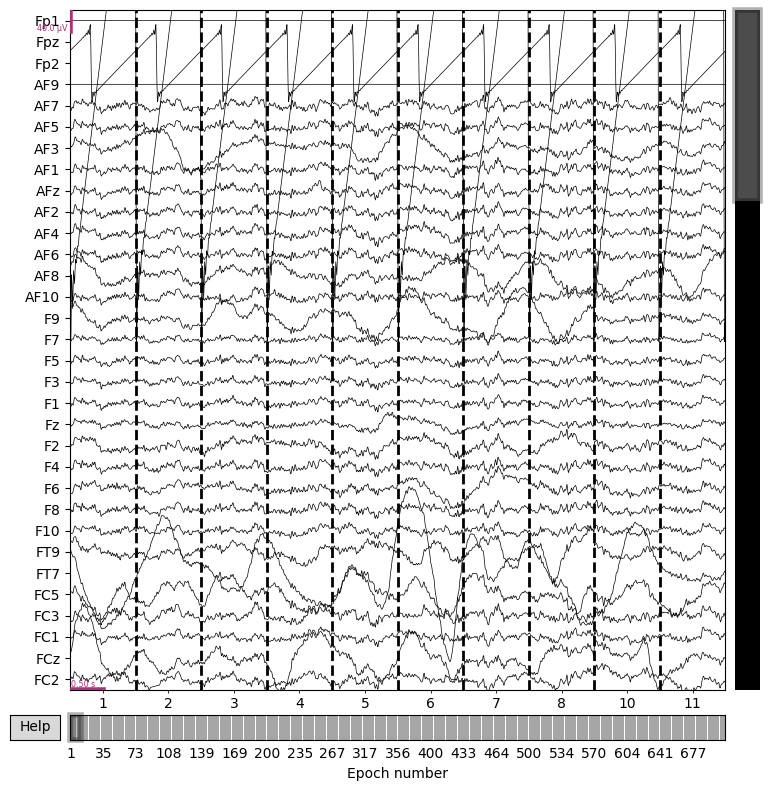

In [ ]:
epochs_ransac.plot(n_epochs=10,n_channels=32,scalings={'eeg': 20e-6})

In [ ]:
#  average referencing
epochs_ransac.set_eeg_reference('average')

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


Number of events,600
Events,1: 600
Time range,0.000 – 1.000 s
Baseline,off


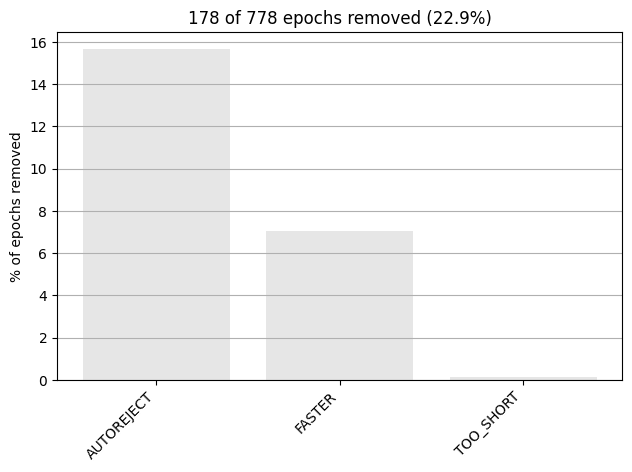

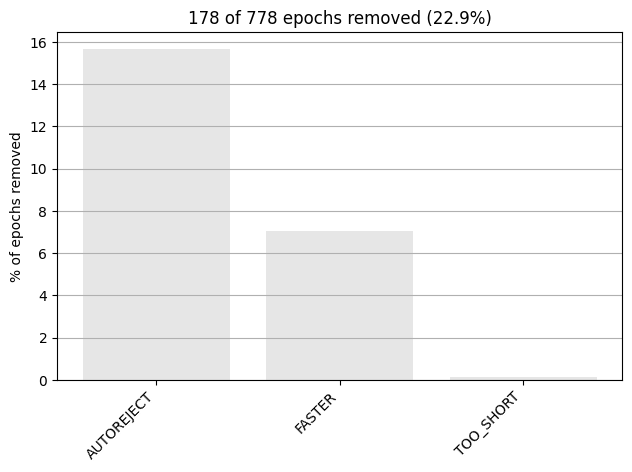

In [ ]:
epochs_ransac.plot_drop_log()

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...


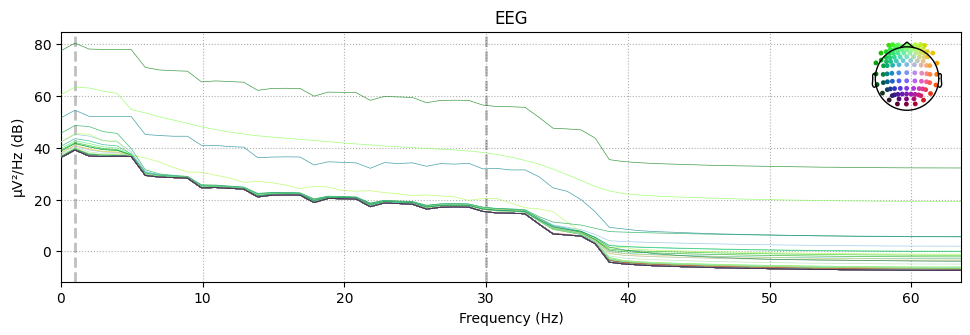

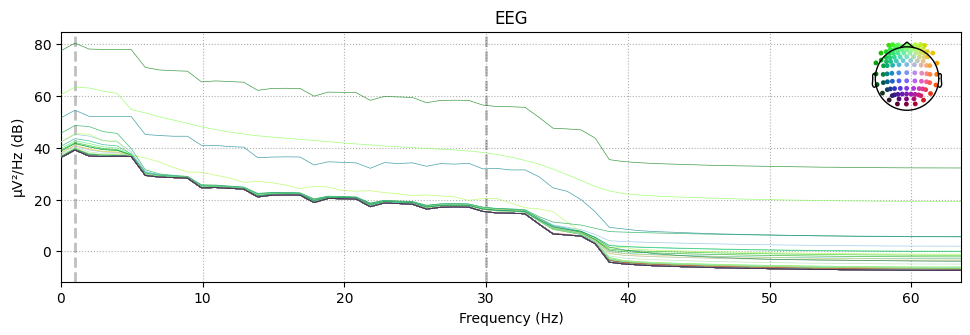

In [ ]:
epochs_ransac.plot_psd()

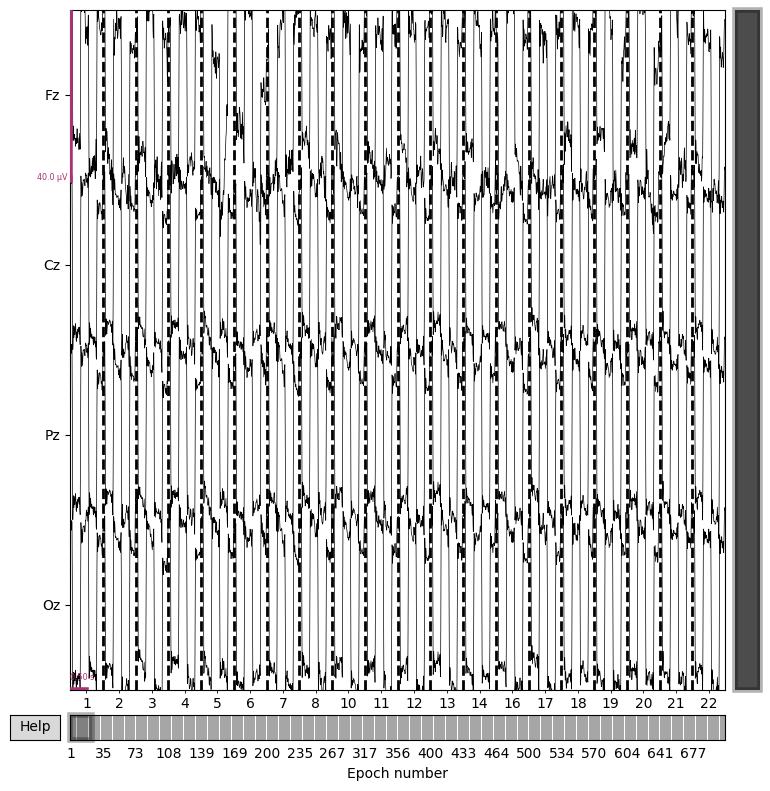

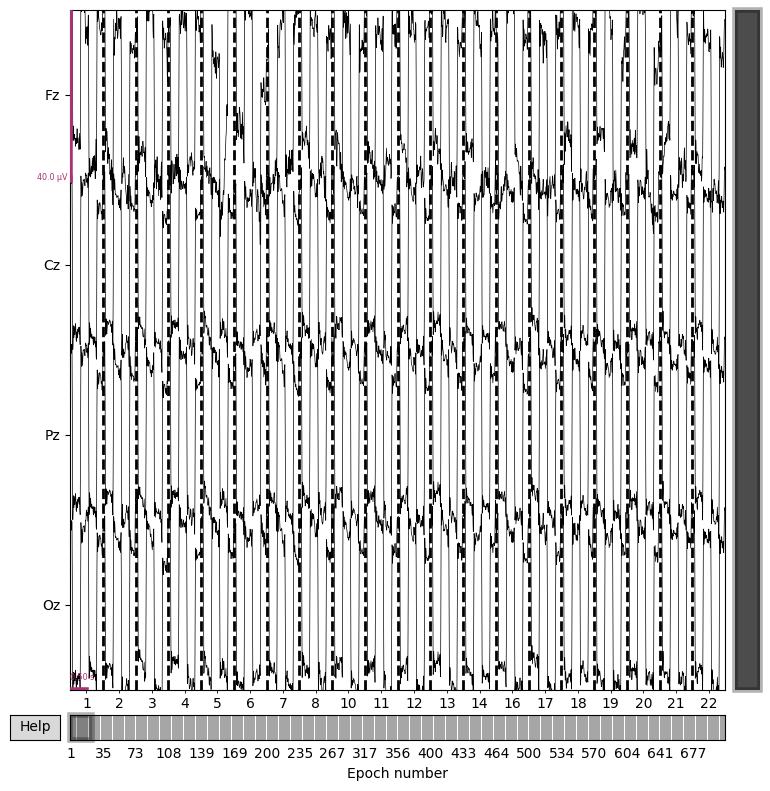

In [ ]:
epochs_ransac.plot(picks='eeg')
#  plot specifically for OZ FZ PZ CZ

In [ ]:

baseline_start = 0.0
baseline_end = 1.0
# performing baseline correction
epochs_ransac.apply_baseline(baseline=(baseline_start, baseline_end))

Applying baseline correction (mode: mean)


Number of events,600
Events,1: 600
Time range,0.000 – 1.000 s
Baseline,0.000 – 1.000 s


In [ ]:
# Overall topoplots before ignoring the bad channels
from mne.time_frequency import tfr_morlet
#  alpha Frequency range
freqs = np.logspace(*np.log10([8, 13]), num=20)


power, itc = tfr_morlet(epochs_ransac,
                        freqs=freqs,
                        n_cycles=freqs/2,
                        return_itc=True,
                        decim=1,
                        average=True,
                        n_jobs=8)

[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  10 tasks      | elapsed:    6.3s
[Parallel(n_jobs=8)]: Done  64 tasks      | elapsed:   21.2s
[Parallel(n_jobs=8)]: Done 114 out of 114 | elapsed:   32.6s finished


In [ ]:
# simple normalization of power bins by 1/f

power_f_corrected = np.zeros_like(power.data)

# divide power by 1/f
for e in range(power.data.shape[0]):
    for f in range(power.data.shape[1]):
        power_f_corrected[e][f] = power.data[e][f] / (1/power.freqs[f])

power.data = power_f_corrected

No baseline correction applied


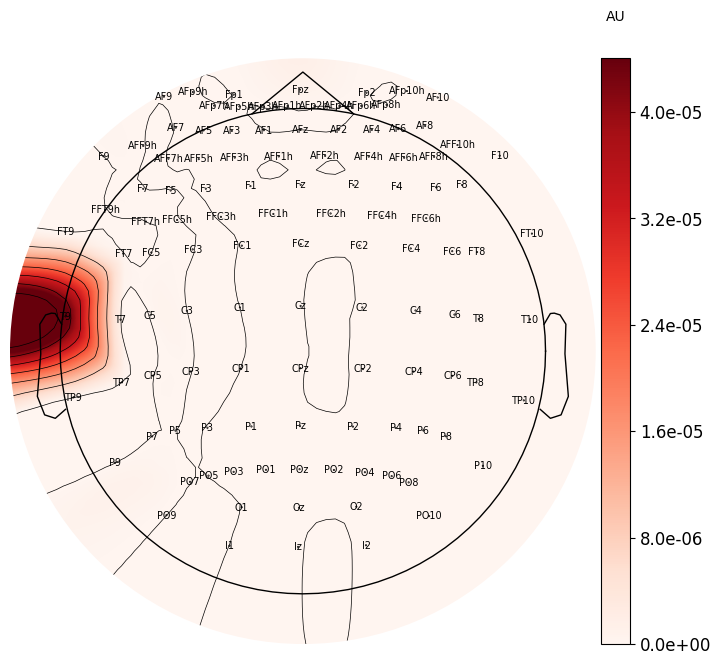

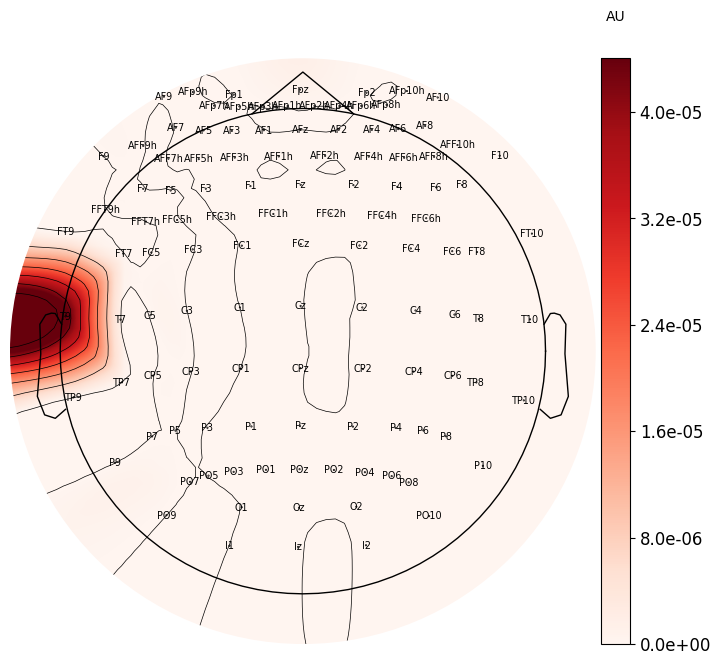

In [ ]:
power.plot_topomap(ch_type='eeg', fmin=8, fmax=13, show=True, show_names=True, size=8)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Applying baseline correction (mode: logratio)


/usr/local/lib/python3.10/dist-packages/mne/time_frequency/tfr.py:1725: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figs = [plt.figure() for i in range(n_picks)]


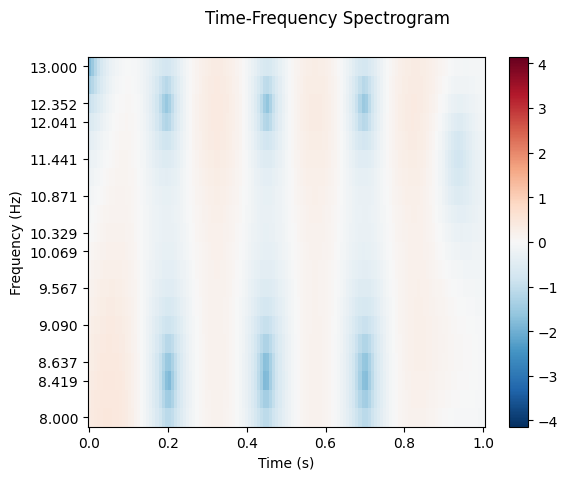

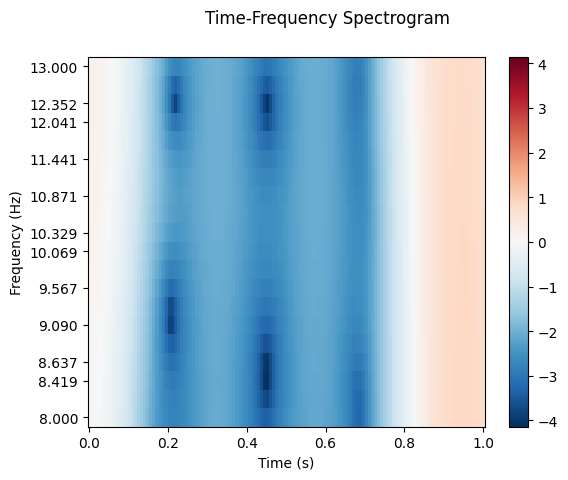

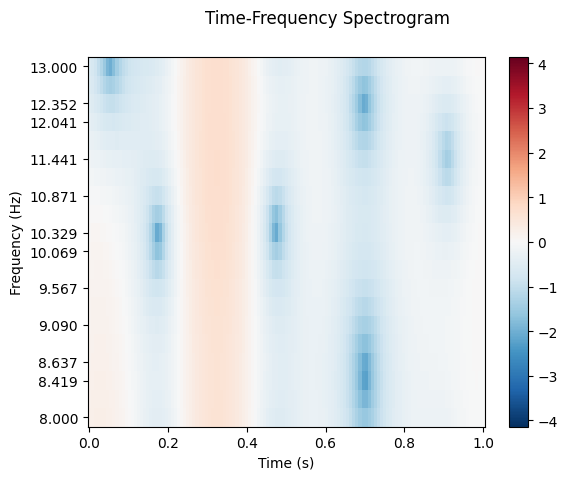

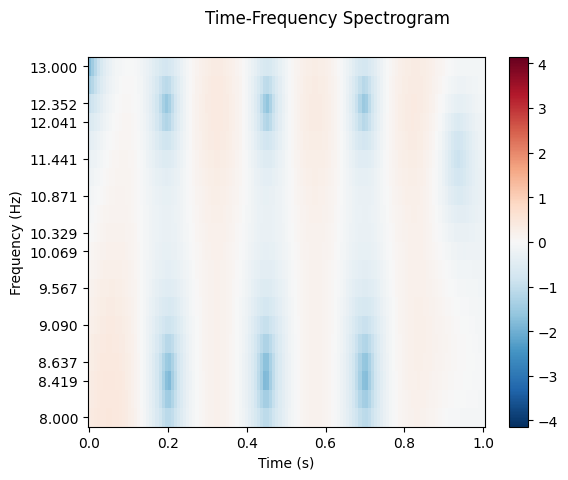

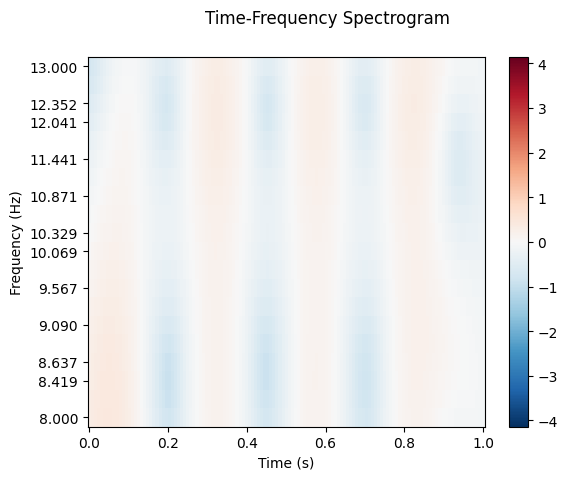

...

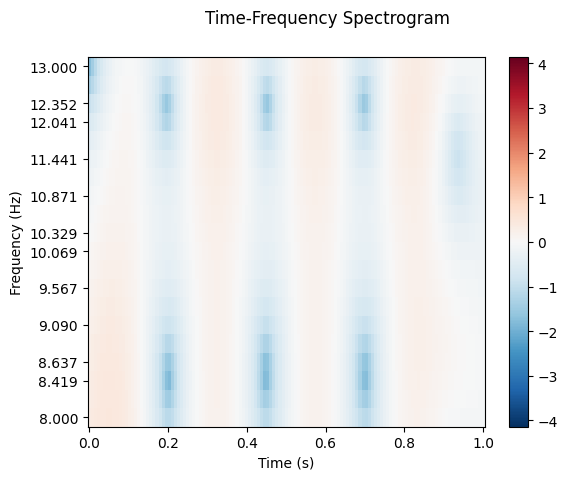

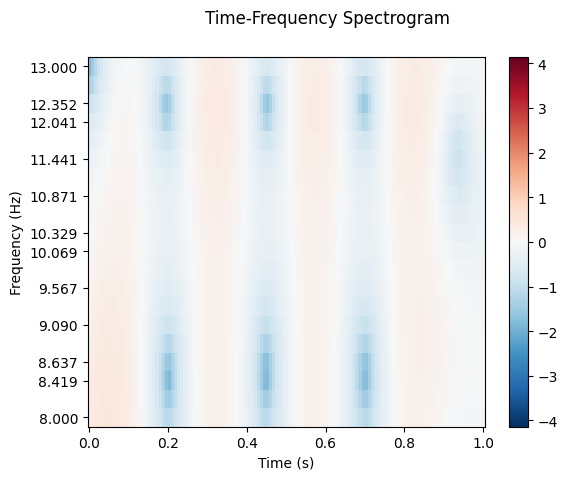

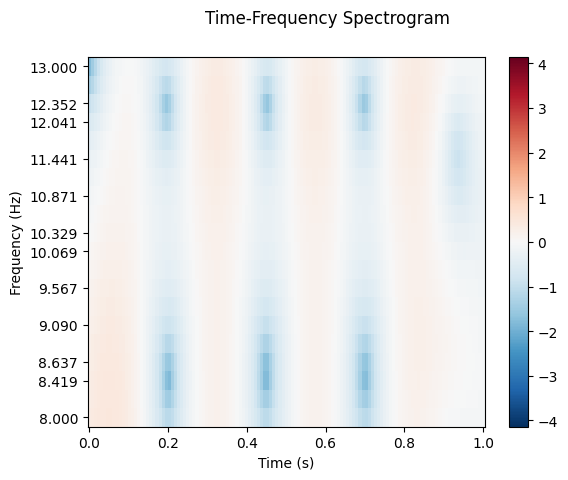

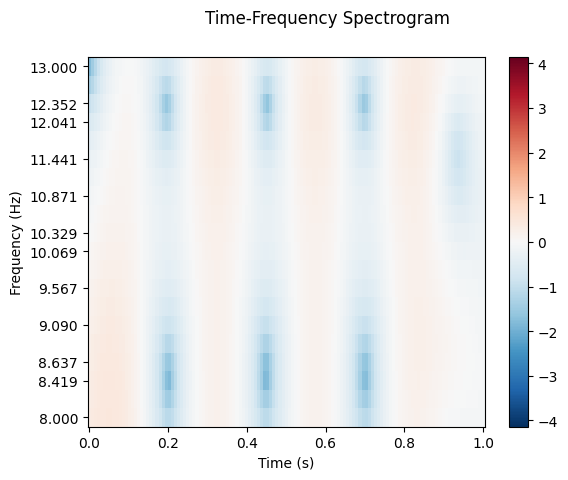

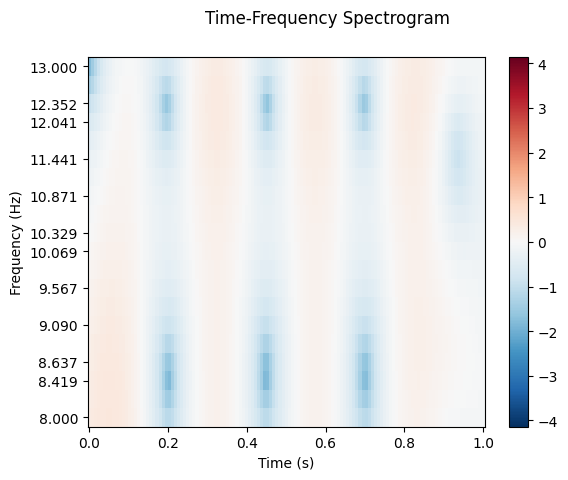

[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2

In [ ]:
power.plot(picks='eeg', baseline=( 0,1), mode='logratio', title='Time-Frequency Spectrogram')

In [ ]:
# Now topoplots after removing the bad channels
from mne.time_frequency import tfr_morlet
#  alpha Frequency range
freqs = np.logspace(*np.log10([8, 13]), num=20)
# Run this at the end as this will remove some channel which I am using in the further analysis below
# In case you run this, then before going for the next 4 case of time freq analysis do the interpolation step once again

tmp=epochs_ransac
tmp.info['bads'] = ['Fpz', 'PO8', 'CP2', 'AF9', 'T9', 'AFF2h', 'I1', 'AFF10h', 'AFp1h', 'AFp3h', 'FFC2h', 'AFp10h', 'FC3', 'PO5', 'Cz', 'FFC4h', 'FFC3h', 'PO10', 'FT7', 'P1', 'P5', 'P9', 'CP3', 'CPz', 'AFF5h', 'FFC5h', 'FC5', 'Pz', 'C1', 'P8', 'F2', 'PO7', 'TP10', 'FC1', 'AF3', 'PO6', 'CP1', 'Fp2', 'Iz', 'AFF1h', 'C5', 'PO1', 'AFp2h', 'Fz', 'AFp5h', 'P3', 'T10', 'CP6', 'PO3', 'AFF8h', 'FFT7h', 'AFp9h', 'AFF4h', 'O1', 'PO4', 'P10', 'AFF3h', 'AF8', 'F7', 'Oz', 'T7', 'PO9', 'TP7', 'PO2', 'FFC6h', 'FFC1h', 'P6', 'AFp7h', 'C3', 'AFF6h', 'FFT9h', 'AFp8h', 'AFF9h', 'AFp4h', 'AFF7h', 'Fp1', 'O2', 'T8', 'I2', 'CP5', 'P4', 'AFp6h', 'TP8', 'P2', 'C4', 'FCz', 'C6', 'CP4', 'TP9', 'P7', 'POz', 'C2']

power, itc = tfr_morlet(tmp,
                        freqs=freqs,
                        n_cycles=freqs/2,
                        return_itc=True,
                        decim=1,
                        average=True,
                        n_jobs=8)

[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  10 tasks      | elapsed:    7.9s
[Parallel(n_jobs=8)]: Done  20 out of  22 | elapsed:   10.5s remaining:    1.1s
[Parallel(n_jobs=8)]: Done  22 out of  22 | elapsed:   10.7s finished


In [ ]:
# simple normalization of power bins by 1/f

power_f_corrected = np.zeros_like(power.data)

# divide power by 1/f
for e in range(power.data.shape[0]):
    for f in range(power.data.shape[1]):
        power_f_corrected[e][f] = power.data[e][f] / (1/power.freqs[f])

power.data = power_f_corrected

No baseline correction applied


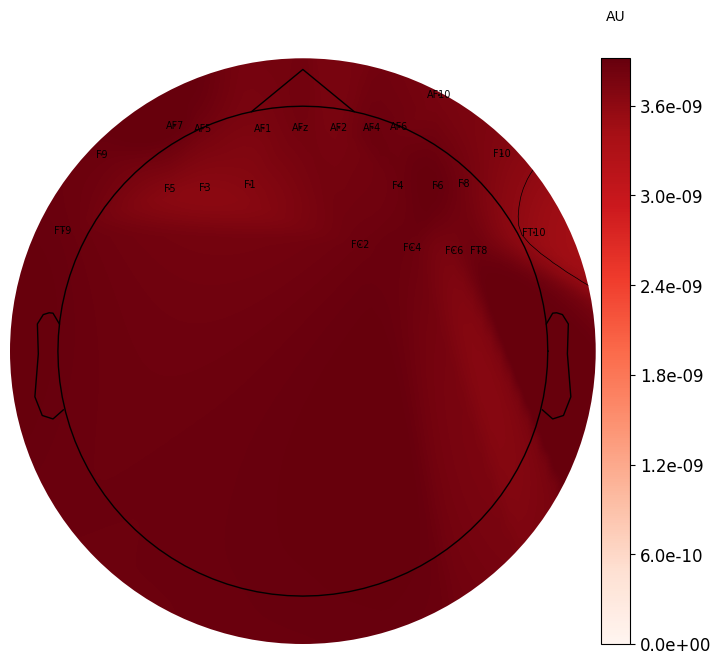

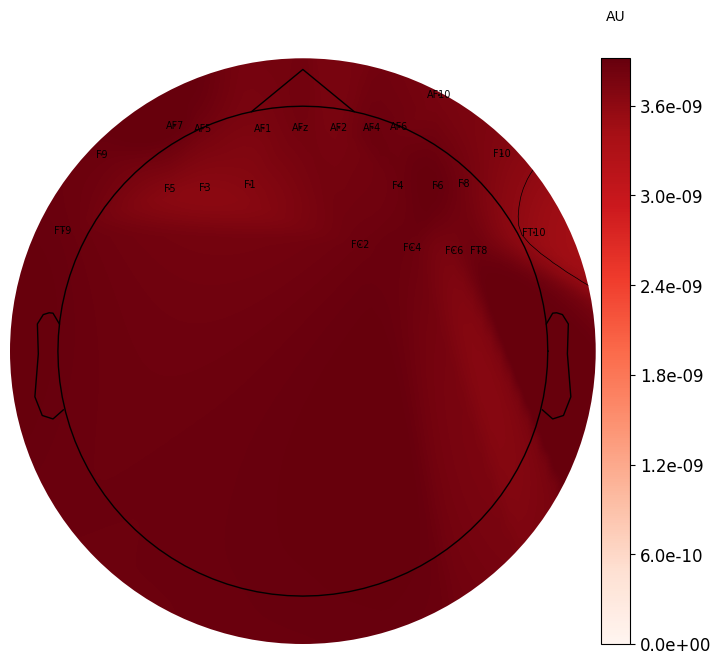

In [ ]:
power.plot_topomap(ch_type='eeg', fmin=8, fmax=13, show=True, show_names=True, size=8)

In [ ]:
from mne.time_frequency import tfr_morlet
#  Delta Case Frequency
freqs = np.logspace(*np.log10([1, 4]), num=20)

channel_of_interest = ['Fz','Oz','Pz','Cz']
epochs = epochs_ransac.copy().pick_channels(channel_of_interest)

power, itc = tfr_morlet(epochs,
                        freqs=freqs,
                        n_cycles=freqs/2,
                        return_itc=True,
                        decim=1,
                        average=True,
                        n_jobs=8)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


<ipython-input-178-4da46147b529>:6: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  epochs = epochs_ransac.copy().pick_channels(channel_of_interest)
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 out of   4 | elapsed:    1.8s remaining:    1.8s
[Parallel(n_jobs=8)]: Done   4 out of   4 | elapsed:    1.9s finished


In [ ]:
# simple normalization of power bins by 1/f

power_f_corrected = np.zeros_like(power.data)

# divide power by 1/f
for e in range(power.data.shape[0]):
    for f in range(power.data.shape[1]):
        power_f_corrected[e][f] = power.data[e][f] / (1/power.freqs[f])

power.data = power_f_corrected


No baseline correction applied


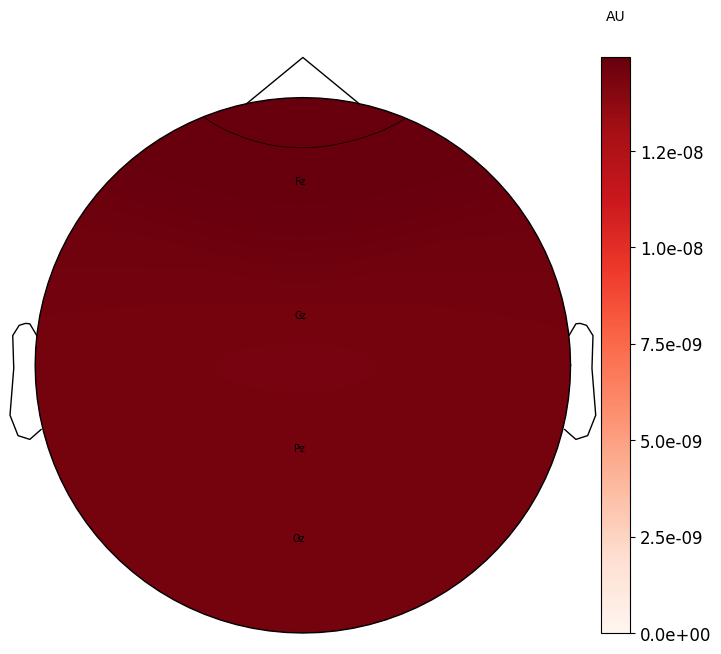

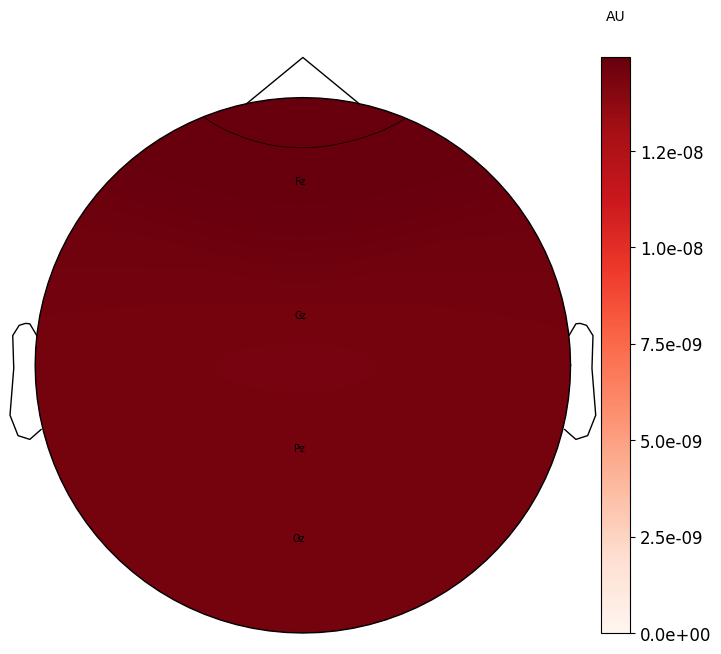

In [ ]:
power.plot_topomap(ch_type='eeg', fmin=1, fmax=4, show=True, show_names=True, size=8)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Applying baseline correction (mode: logratio)


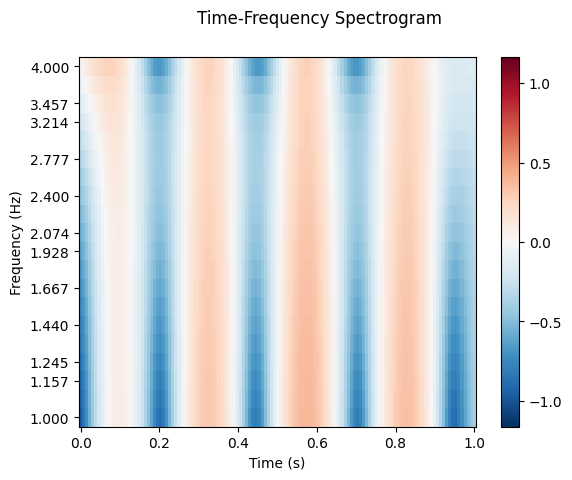

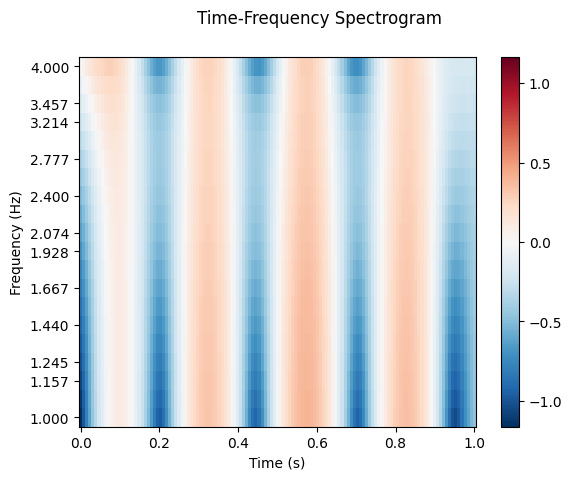

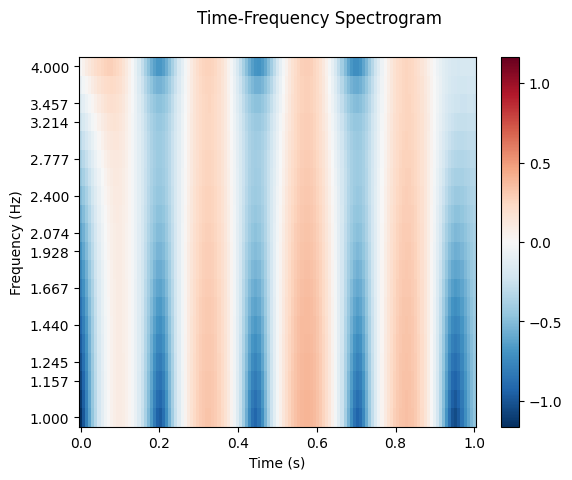

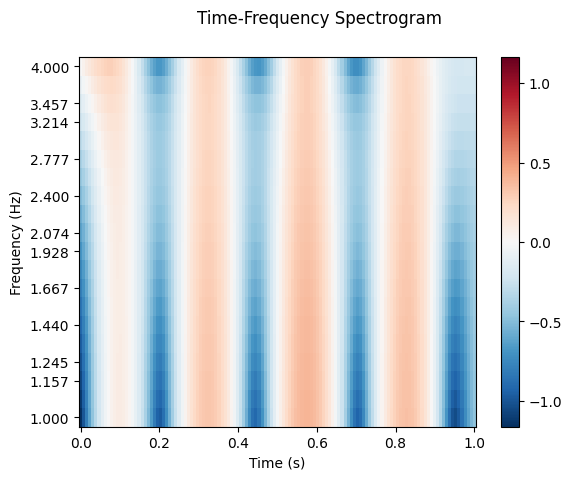

[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

In [ ]:
power.plot(picks='eeg', baseline=( 0,1), mode='logratio', title='Time-Frequency Spectrogram')

In [ ]:
power_avg_epoch_electrode = power.data.mean(axis=-1)

In [ ]:
power.to_data_frame(picks=None, index=None, long_format=False, time_format='ms')

,time,freq,Fz,Cz,Pz,Oz
0,0,1.0,1.120513e-09,6.856678e-10,6.856795e-10,6.876154e-10
1,8,1.0,1.454268e-09,1.020797e-09,1.020816e-09,1.017948e-09
2,16,1.0,2.013964e-09,1.587913e-09,1.587944e-09,1.580043e-09
3,23,1.0,2.813427e-09,2.400064e-09,2.400114e-09,2.387218e-09
4,31,1.0,3.842989e-09,3.446547e-09,3.446623e-09,3.429036e-09
...,...,...,...,...,...,...
2575,969,4.0,8.730151e-09,7.906287e-09,7.906347e-09,7.879488e-09
2576,977,4.0,8.805203e-09,7.952833e-09,7.952895e-09,7.924915e-09
2577,984,4.0,8.855149e-09,7.985591e-09,7.985655e-09,7.956867e-09
2578,992,4.0,8.842167e-09,7.969408e-09,7.969474e-09,7.940304e-09


In [ ]:
case1=np.mean(power_avg_epoch_electrode)
case1

1.4607680522870899e-08

In [ ]:
from mne.time_frequency import tfr_morlet

freqs = np.logspace(*np.log10([4, 8]), num=20)
# theta frequency case
channel_of_interest = ['Fz','Oz','Pz','Cz']
epochs = epochs_ransac.copy().pick_channels(channel_of_interest)

power, itc = tfr_morlet(epochs,
                        freqs=freqs,
                        n_cycles=freqs/2,
                        return_itc=True,
                        decim=1,
                        average=True,
                        n_jobs=8)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


<ipython-input-210-a813260b78dd>:6: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  epochs = epochs_ransac.copy().pick_channels(channel_of_interest)
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 out of   4 | elapsed:    0.7s remaining:    0.7s
[Parallel(n_jobs=8)]: Done   4 out of   4 | elapsed:    0.8s finished


In [ ]:
# simple normalization of power bins by 1/f

power_f_corrected = np.zeros_like(power.data)

# divide power by 1/f
for e in range(power.data.shape[0]):
    for f in range(power.data.shape[1]):
        power_f_corrected[e][f] = power.data[e][f] / (1/power.freqs[f])

power.data = power_f_corrected


No baseline correction applied


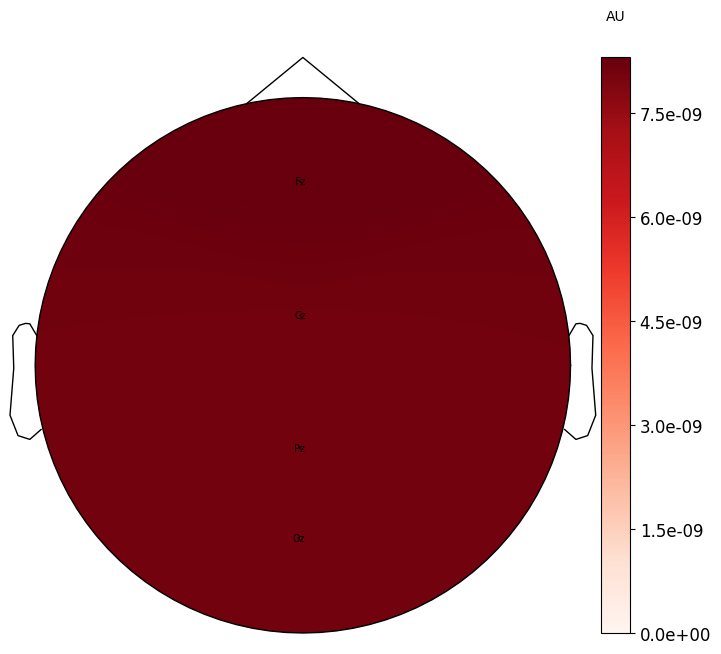

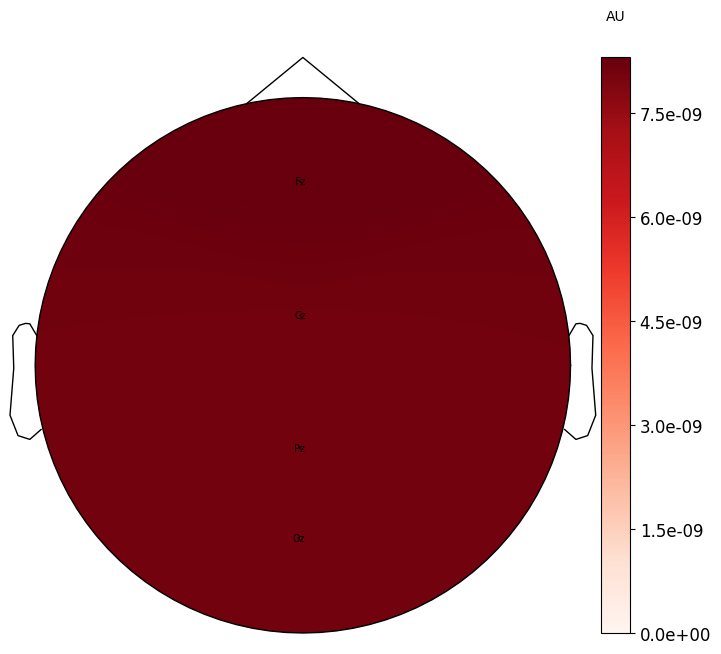

In [ ]:
power.plot_topomap(ch_type='eeg', fmin=4, fmax=8, show=True, show_names=True, size=8)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Applying baseline correction (mode: logratio)


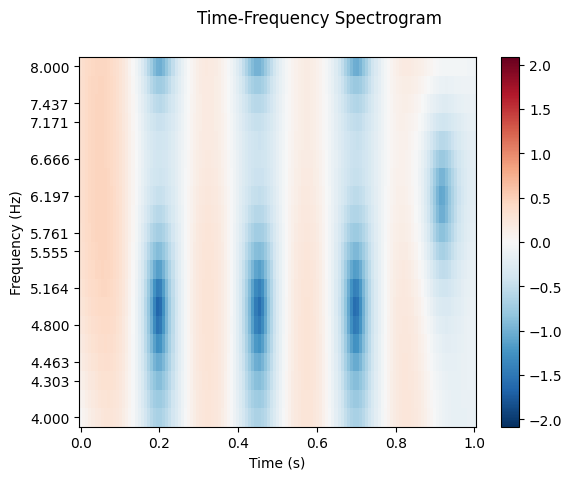

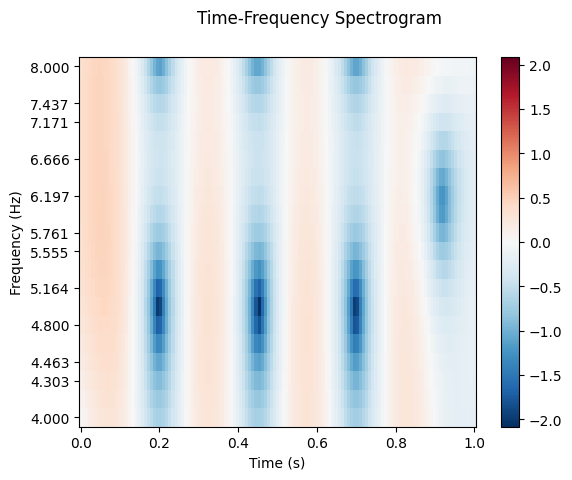

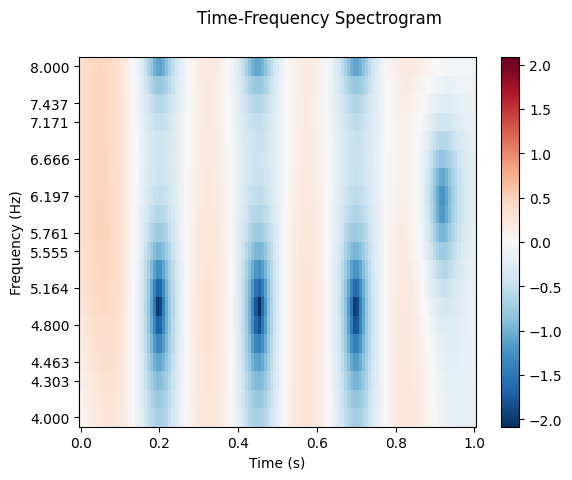

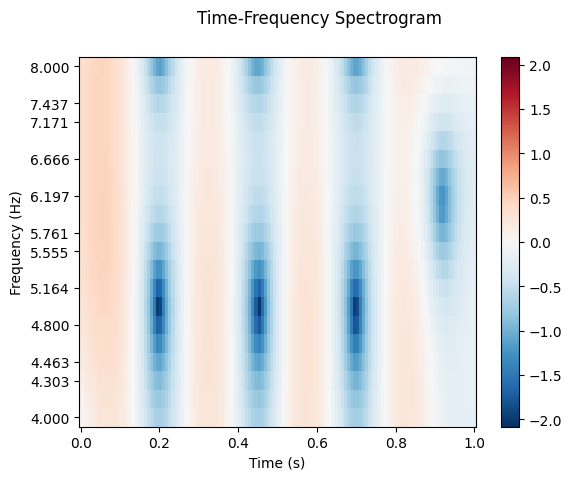

[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

In [ ]:
power.plot(picks='eeg', baseline=( 0,1), mode='logratio', title='Time-Frequency Spectrogram')

In [ ]:
power_avg_epoch_electrode = power.data.mean(axis=-1)

In [ ]:
power.to_data_frame(picks=None, index=None, long_format=False, time_format='ms')

,time,freq,Fz,Cz,Pz,Oz
0,0,4.0,1.326943e-08,1.272371e-08,1.272379e-08,1.276003e-08
1,8,4.0,1.459253e-08,1.404151e-08,1.404160e-08,1.407532e-08
2,16,4.0,1.599489e-08,1.544785e-08,1.544795e-08,1.547825e-08
3,23,4.0,1.745958e-08,1.692514e-08,1.692525e-08,1.695147e-08
4,31,4.0,1.894645e-08,1.843225e-08,1.843239e-08,1.845416e-08
...,...,...,...,...,...,...
2575,969,8.0,4.512912e-09,4.325014e-09,4.325033e-09,4.316167e-09
2576,977,8.0,4.489780e-09,4.292603e-09,4.292623e-09,4.283237e-09
2577,984,8.0,4.432058e-09,4.228613e-09,4.228633e-09,4.218913e-09
2578,992,8.0,4.331504e-09,4.125220e-09,4.125241e-09,4.115391e-09


In [ ]:
case2=np.mean(power_avg_epoch_electrode)
case2

8.15067878576971e-09

In [ ]:
from mne.time_frequency import tfr_morlet

freqs = np.logspace(*np.log10([8, 13]), num=20)
# alpha frequency case
channel_of_interest = ['Fz','Oz','Pz','Cz']
epochs = epochs_ransac.copy().pick_channels(channel_of_interest)

power, itc = tfr_morlet(epochs,
                        freqs=freqs,
                        n_cycles=freqs/2,
                        return_itc=True,
                        decim=1,
                        average=True,
                        n_jobs=8)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


<ipython-input-197-f3222601b399>:6: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  epochs = epochs_ransac.copy().pick_channels(channel_of_interest)
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 out of   4 | elapsed:    0.7s remaining:    0.7s
[Parallel(n_jobs=8)]: Done   4 out of   4 | elapsed:    0.7s finished


In [ ]:
# simple normalization of power bins by 1/f

power_f_corrected = np.zeros_like(power.data)

# divide power by 1/f
for e in range(power.data.shape[0]):
    for f in range(power.data.shape[1]):
        power_f_corrected[e][f] = power.data[e][f] / (1/power.freqs[f])

power.data = power_f_corrected

No baseline correction applied


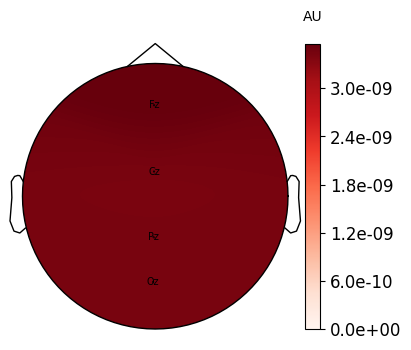

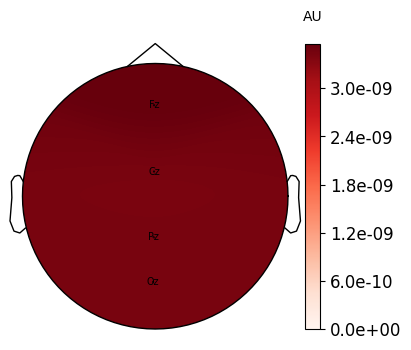

In [ ]:
power.plot_topomap(ch_type='eeg', fmin=8, fmax=13, show=True, show_names=True, size=4)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Applying baseline correction (mode: logratio)


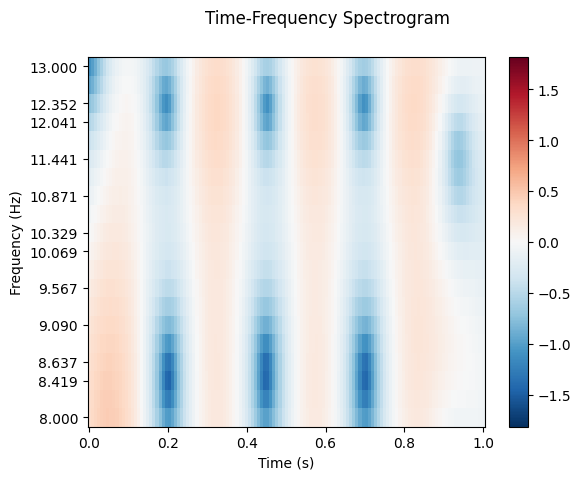

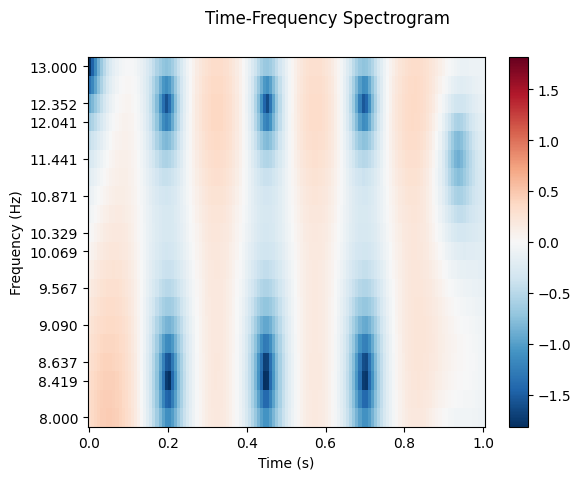

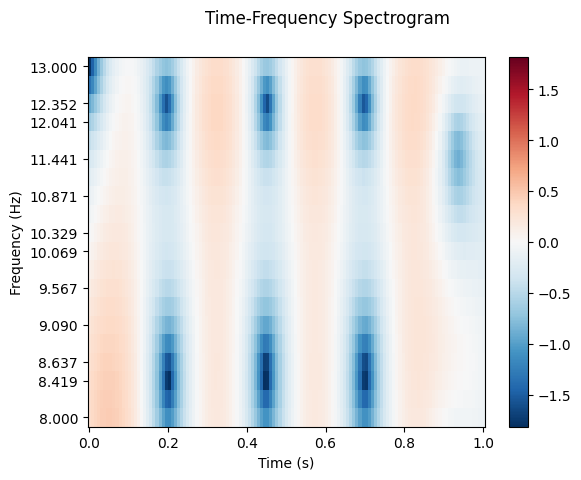

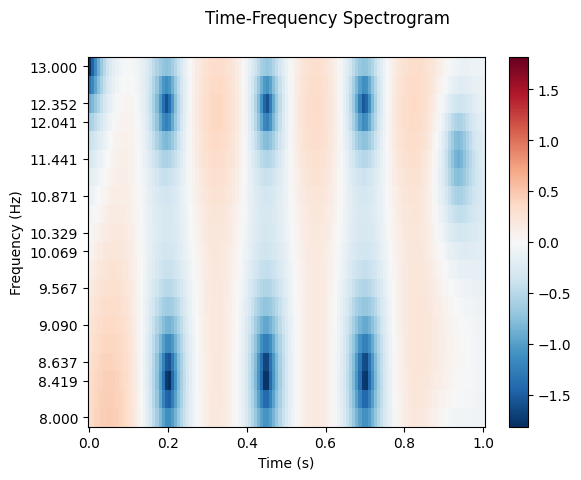

[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

In [ ]:
power.plot(picks='eeg', baseline=( 0,1), mode='logratio', title='Time-Frequency Spectrogram')

In [ ]:
power_avg_epoch_electrode = power.data.mean(axis=-1)

In [ ]:
power.to_data_frame(picks=None, index=None, long_format=False, time_format='ms')

,time,freq,Fz,Cz,Pz,Oz
0,0,8.0,1.099555e-08,1.072982e-08,1.072986e-08,1.075781e-08
1,8,8.0,1.200536e-08,1.173245e-08,1.173250e-08,1.176134e-08
2,16,8.0,1.291206e-08,1.263514e-08,1.263519e-08,1.266439e-08
3,23,8.0,1.367873e-08,1.340057e-08,1.340061e-08,1.342963e-08
4,31,8.0,1.427149e-08,1.399434e-08,1.399438e-08,1.402269e-08
...,...,...,...,...,...,...
2575,969,13.0,1.797597e-09,1.652012e-09,1.652021e-09,1.651519e-09
2576,977,13.0,1.815152e-09,1.674423e-09,1.674432e-09,1.673491e-09
2577,984,13.0,1.828410e-09,1.692836e-09,1.692846e-09,1.691531e-09
2578,992,13.0,1.829980e-09,1.700011e-09,1.700022e-09,1.698413e-09


In [ ]:
case3=np.mean(power_avg_epoch_electrode)
case3

3.5416950792411704e-09

In [ ]:
from mne.time_frequency import tfr_morlet

freqs = np.logspace(*np.log10([13, 30]), num=20)
# Beta frequency case
channel_of_interest = ['Fz','Oz','Pz','Cz']
epochs = epochs_ransac.copy().pick_channels(channel_of_interest)

power, itc = tfr_morlet(epochs,
                        freqs=freqs,
                        n_cycles=freqs/2,
                        return_itc=True,
                        decim=1,
                        average=True,
                        n_jobs=8)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


<ipython-input-200-fc08a3443f0b>:6: FutureWarning: The default for pick_channels will change from ordered=False to ordered=True in 1.5 and this will result in a change of behavior because the resulting channel order will not match. Either use a channel order that matches your instance or pass ordered=False.
  epochs = epochs_ransac.copy().pick_channels(channel_of_interest)
[Parallel(n_jobs=8)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 out of   4 | elapsed:    0.7s remaining:    0.7s
[Parallel(n_jobs=8)]: Done   4 out of   4 | elapsed:    0.8s finished


In [ ]:
# simple normalization of power bins by 1/f

power_f_corrected = np.zeros_like(power.data)

# divide power by 1/f
for e in range(power.data.shape[0]):
    for f in range(power.data.shape[1]):
        power_f_corrected[e][f] = power.data[e][f] / (1/power.freqs[f])

power.data = power_f_corrected

No baseline correction applied


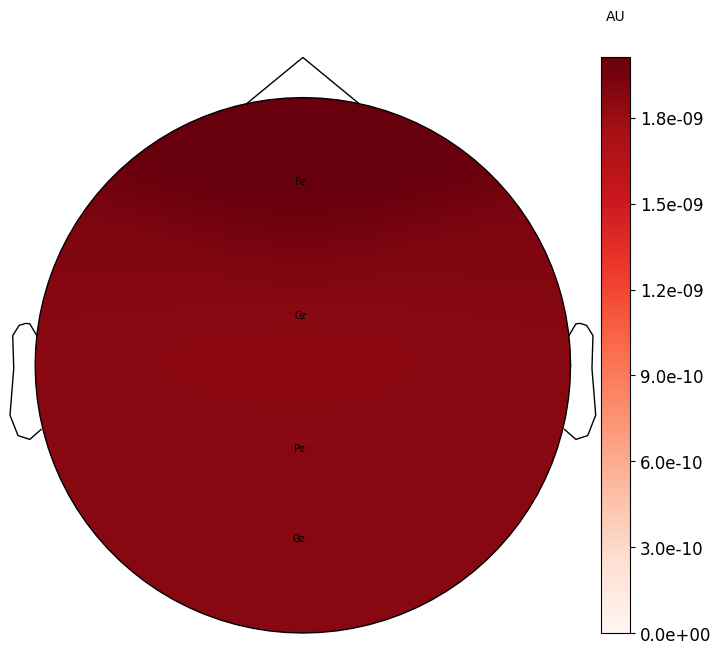

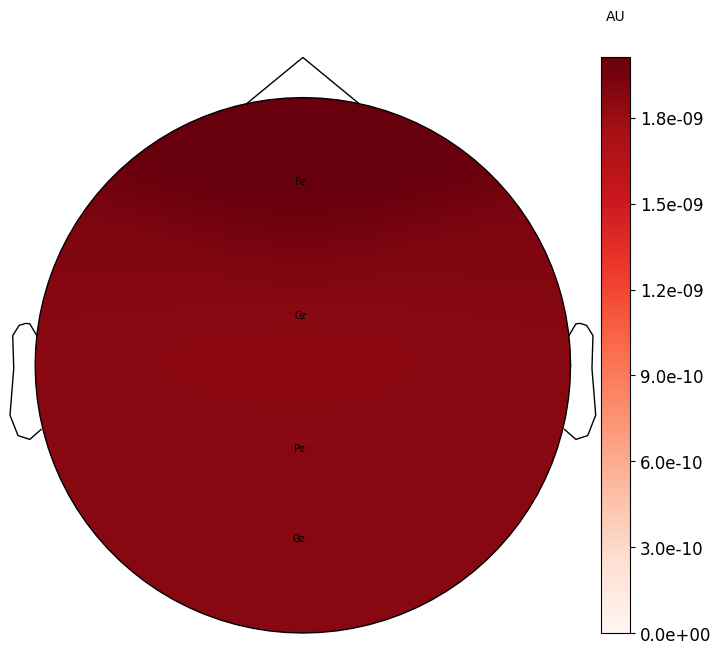

In [ ]:
power.plot_topomap(ch_type='eeg', fmin=13, fmax=30, show=True, show_names=True, size=8)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
Applying baseline correction (mode: logratio)


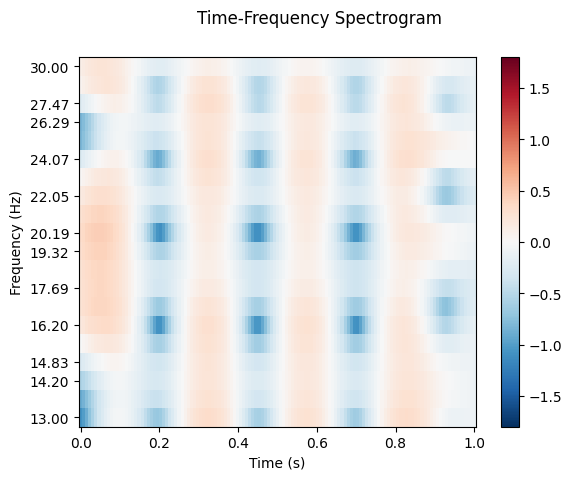

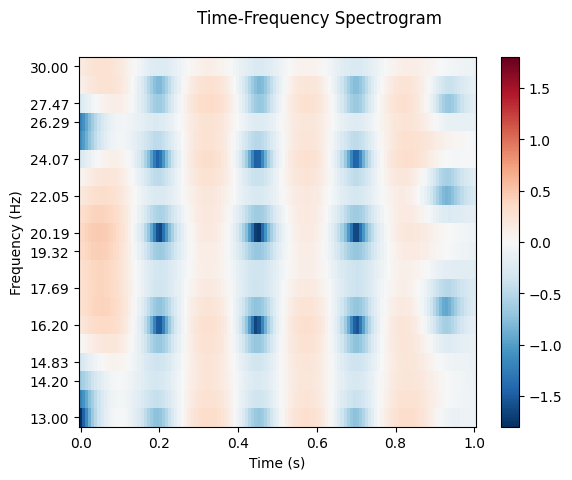

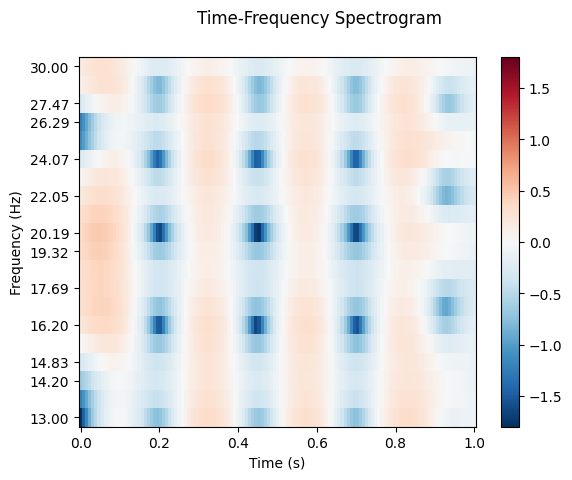

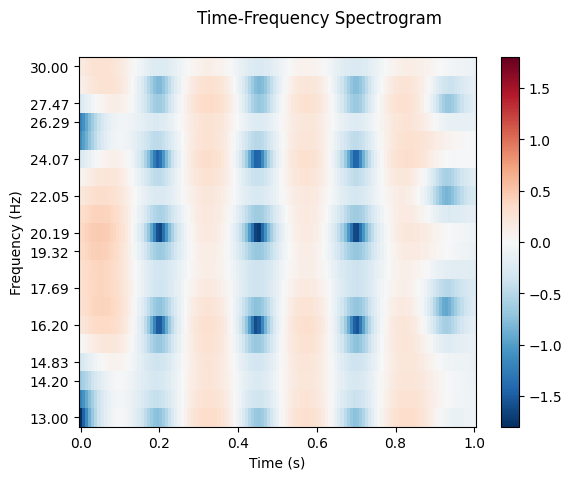

[<Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 2 Axes>]

In [ ]:
power.plot(picks='eeg', baseline=( 0,1), mode='logratio', title='Time-Frequency Spectrogram')

In [ ]:
power_avg_epoch_electrode = power.data.mean(axis=-1)

In [ ]:
power.to_data_frame(picks=None, index=None, long_format=False, time_format='ms')

,time,freq,Fz,Cz,Pz,Oz
0,0,13.0,1.893822e-10,3.382211e-11,3.381804e-11,3.411051e-11
1,8,13.0,2.270652e-10,7.287620e-11,7.286856e-11,7.231030e-11
2,16,13.0,3.046756e-10,1.546963e-10,1.546840e-10,1.532483e-10
3,23,13.0,4.257695e-10,2.825206e-10,2.825026e-10,2.802124e-10
4,31,13.0,5.895669e-10,4.551012e-10,4.550763e-10,4.520035e-10
...,...,...,...,...,...,...
2575,969,30.0,1.521244e-09,1.325914e-09,1.325919e-09,1.334961e-09
2576,977,30.0,1.493361e-09,1.303965e-09,1.303970e-09,1.313064e-09
2577,984,30.0,1.458968e-09,1.277074e-09,1.277079e-09,1.286117e-09
2578,992,30.0,1.415701e-09,1.242829e-09,1.242834e-09,1.251702e-09


In [ ]:
case4=np.mean(power_avg_epoch_electrode)
case4

1.9186268236026746e-09

In [ ]:
Final_answer= (case1+case2+case3+case4)/4
Final_answer

7.054670302871114e-09